In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from datetime import datetime
plt.style.use('default')

import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv('solarPanels.csv')
df

,date,Cumulative_solar_power,kWh electricity/day,Gas/day
0,26/10/2011,0.1,15.1,9.0
1,27/10/2011,10.2,7.4,9.2
2,28/10/2011,20.2,5.8,8.0
3,29/10/2011,29.6,4.9,6.6
4,30/10/2011,34.2,11.7,5.3
...,...,...,...,...
3299,6/11/2020,36445.0,16.0,11.0
3300,7/11/2020,36453.0,13.0,13.0
3301,8/11/2020,36461.0,12.0,11.0
3302,9/11/2020,36466.0,14.0,10.0


<AxesSubplot:>

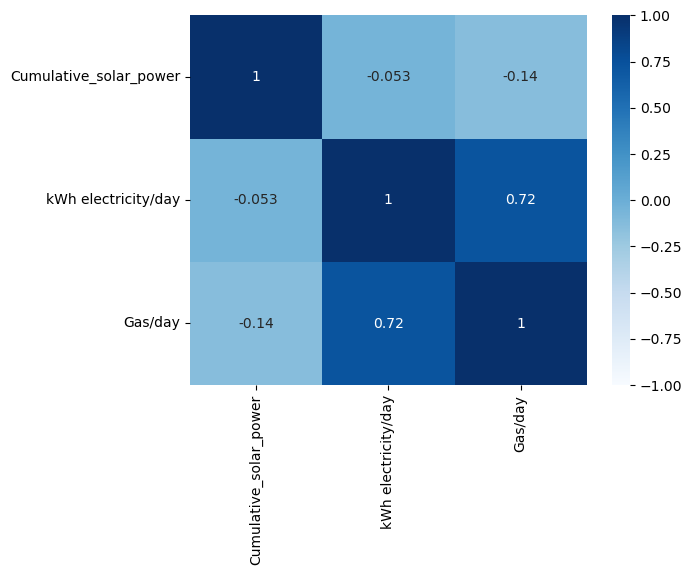

In [3]:
sns.heatmap(df.corr(), annot=True, cmap='Blues', vmin=-1, vmax=1)

In [4]:
df['date'] = pd.to_datetime(df['date'], format='%d/%m/%Y')
df['day'] = df['date'].dt.day
df['month'] = df['date'].dt.month
df['year'] = df['date'].dt.year
df['Cumulative_electricity'] = df['kWh electricity/day'].cumsum()
df['Cumulative_gas'] = df['Gas/day'].cumsum()
df['Solar/day'] = df['Cumulative_solar_power'].diff()
df.at[0,'Solar/day'] = df['Cumulative_solar_power'][0]

print(df.shape)
df.head()

(3304, 10)


,date,Cumulative_solar_power,kWh electricity/day,Gas/day,day,month,year,Cumulative_electricity,Cumulative_gas,Solar/day
0,2011-10-26,0.1,15.1,9.0,26,10,2011,15.1,9.0,0.1
1,2011-10-27,10.2,7.4,9.2,27,10,2011,22.5,18.2,10.1
2,2011-10-28,20.2,5.8,8.0,28,10,2011,28.3,26.2,10.0
3,2011-10-29,29.6,4.9,6.6,29,10,2011,33.2,32.8,9.4
4,2011-10-30,34.2,11.7,5.3,30,10,2011,44.9,38.1,4.6


In [5]:
df.describe()

,Cumulative_solar_power,kWh electricity/day,Gas/day,day,month,year,Cumulative_electricity,Cumulative_gas,Solar/day
count,3304.000000,3304.000000,3304.000000,3304.000000,3304.000000,3304.000000,3304.000000,3304.000000,3304.000000
mean,17616.116435,4.585048,8.343705,15.724879,6.541768,2015.836864,8046.935169,14517.969885,11.037833
std,10577.158537,9.856726,6.334102,8.817916,3.453082,2.621730,4255.834499,7972.453244,8.293771
min,0.100000,-24.000000,0.000000,1.000000,1.000000,2011.000000,15.100000,9.000000,0.000000
25%,8089.500000,-3.000000,2.000000,8.000000,4.000000,2014.000000,4766.500000,7949.600000,4.000000
50%,17184.500000,6.000000,8.000000,16.000000,7.000000,2016.000000,8554.000000,15113.600000,9.000000
75%,27116.500000,13.000000,13.000000,23.000000,10.000000,2018.000000,11670.500000,21375.600000,17.000000
max,36469.000000,34.000000,29.000000,31.000000,12.000000,2020.000000,15149.000000,27567.600000,34.000000


In [6]:
df.isna().sum()

date                      0
Cumulative_solar_power    0
kWh electricity/day       0
Gas/day                   0
day                       0
month                     0
year                      0
Cumulative_electricity    0
Cumulative_gas            0
Solar/day                 0
dtype: int64

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3304 entries, 0 to 3303
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   date                    3304 non-null   datetime64[ns]
 1   Cumulative_solar_power  3304 non-null   float64       
 2   kWh electricity/day     3304 non-null   float64       
 3   Gas/day                 3304 non-null   float64       
 4   day                     3304 non-null   int64         
 5   month                   3304 non-null   int64         
 6   year                    3304 non-null   int64         
 7   Cumulative_electricity  3304 non-null   float64       
 8   Cumulative_gas          3304 non-null   float64       
 9   Solar/day               3304 non-null   float64       
dtypes: datetime64[ns](1), float64(6), int64(3)
memory usage: 258.2 KB


<AxesSubplot:>

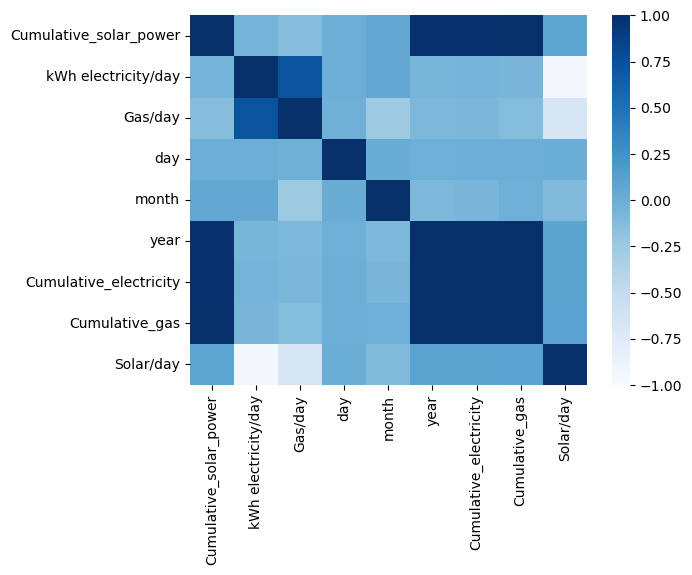

In [8]:
sns.heatmap(df.corr(), cmap='Blues', vmin=-1, vmax=1)

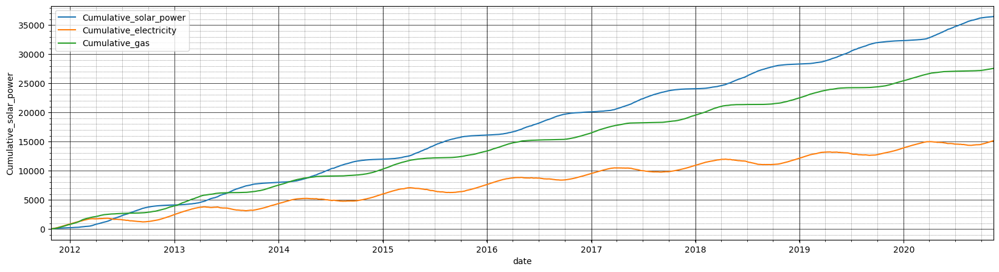

In [9]:
f, ax = plt.subplots(figsize=(20, 5))
sns.lineplot(data=df, x="date", y="Cumulative_solar_power", label='Cumulative_solar_power')
sns.lineplot(data=df, x="date", y="Cumulative_electricity", label='Cumulative_electricity')
sns.lineplot(data=df, x="date", y="Cumulative_gas", label='Cumulative_gas')

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xlim([datetime(2011,10,26), datetime(2020,11,10)])

ax.legend();

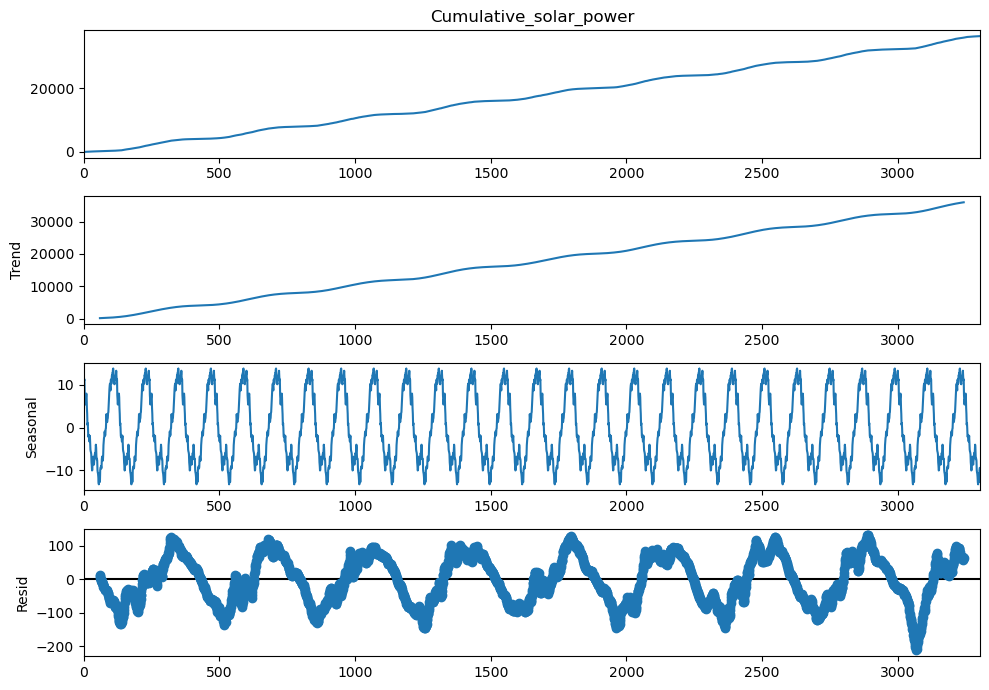

In [10]:
from statsmodels.tsa.seasonal import seasonal_decompose
from pylab import rcParams

result = seasonal_decompose(df['Cumulative_solar_power'], model='additive', period=120)

rcParams['figure.figsize'] = 10,7
result.plot();

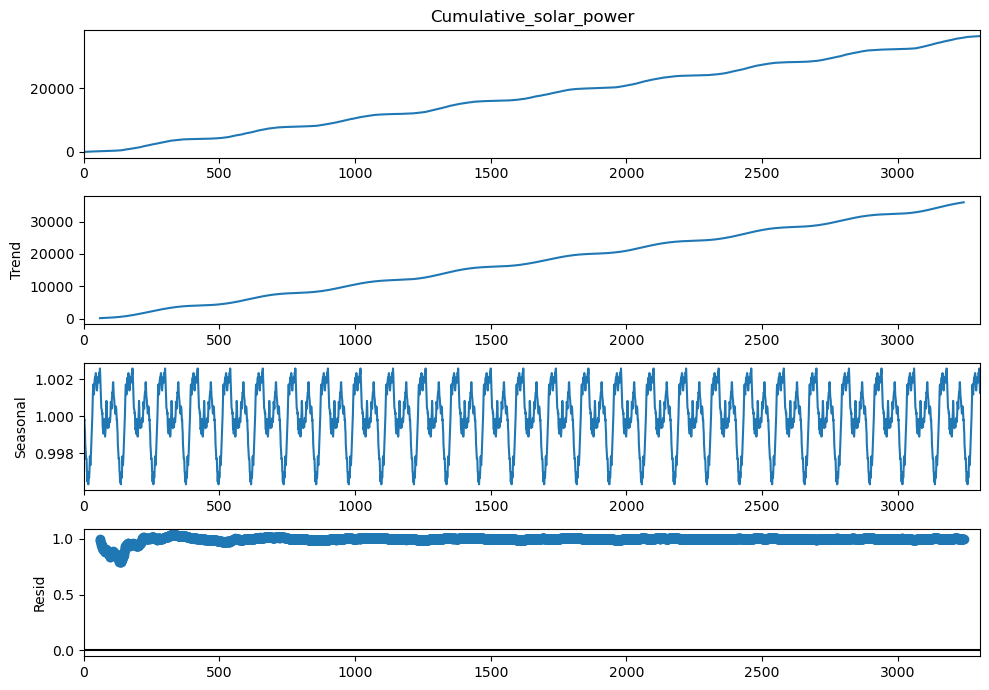

In [11]:
result = seasonal_decompose(df['Cumulative_solar_power'], model='multiplicative', period=120)

rcParams['figure.figsize'] = 10,7
result.plot();

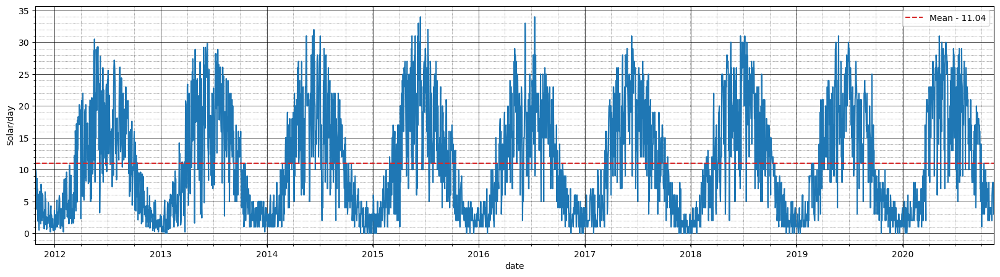

In [12]:
f, ax = plt.subplots(figsize=(20, 5))
sns.lineplot(data=df, x="date", y="Solar/day")

mean_avg=df['Solar/day'].mean()
ax.axhline(mean_avg, color='#d62728', linestyle='--', label=f"Mean - {mean_avg:.2f}")

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xlim([datetime(2011,10,26), datetime(2020,11,10)])

ax.legend();

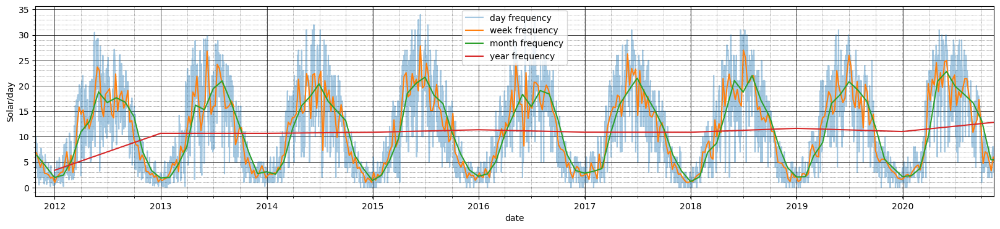

In [13]:
f, ax = plt.subplots(figsize=(20, 4))
data_resample_y = df.resample(rule='Y', on='date').mean()
data_resample_m = df.resample(rule='M', on='date').mean()
data_resample_w = df.resample(rule='W', on='date').mean()

sns.lineplot(data=df, x="date", y="Solar/day", label="day frequency", alpha  = 0.4)
sns.lineplot(data=data_resample_w, x="date", y="Solar/day", label="week frequency")
sns.lineplot(data=data_resample_m, x="date", y="Solar/day", label="month frequency")
sns.lineplot(data=data_resample_y, x="date", y="Solar/day", label="year frequency")

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xlim([datetime(2011,10,26), datetime(2020,11,10)]);

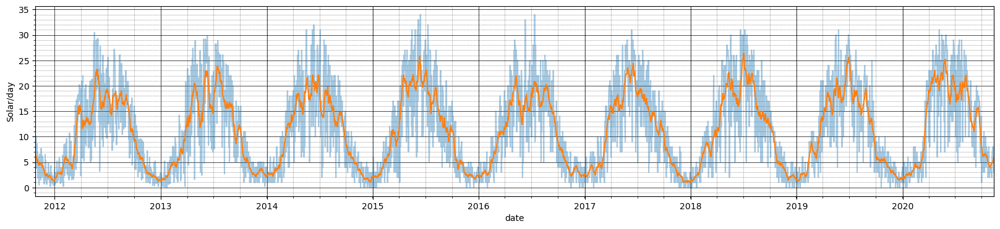

In [14]:
f, ax = plt.subplots(figsize=(20, 4))
data_rolling = df.rolling(15, center=True, min_periods=7).mean()

sns.lineplot(data=df, x="date", y="Solar/day", alpha=0.4)
sns.lineplot(data=df, x="date", y=data_rolling["Solar/day"])

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xlim([datetime(2011,10,26), datetime(2020,11,10)]);

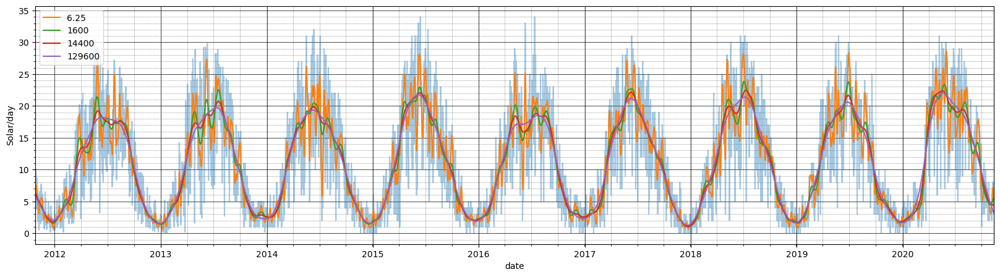

In [15]:
from statsmodels.tsa.filters.hp_filter import hpfilter

cycle_6, trend_6 = hpfilter(df['Solar/day'], lamb=6.25)
cycle_1600, trend_1600 = hpfilter(df['Solar/day'], lamb=1600)
cycle_14400, trend_14400 = hpfilter(df['Solar/day'], lamb=14400)
cycle_129600, trend_129600 = hpfilter(df['Solar/day'], lamb=129600)

f, ax = plt.subplots(figsize=(20, 5))
sns.lineplot(data=df, x="date", y="Solar/day", alpha=0.4)
sns.lineplot(x=df['date'], y=trend_6.to_list(), label="6.25")
sns.lineplot(x=df['date'], y=trend_1600.to_list(), label="1600")
sns.lineplot(x=df['date'], y=trend_14400.to_list(), label="14400")
sns.lineplot(x=df['date'], y=trend_129600.to_list(), label="129600")


ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xlim([datetime(2011,10,26), datetime(2020,11,10)])

ax.legend(loc='upper left');

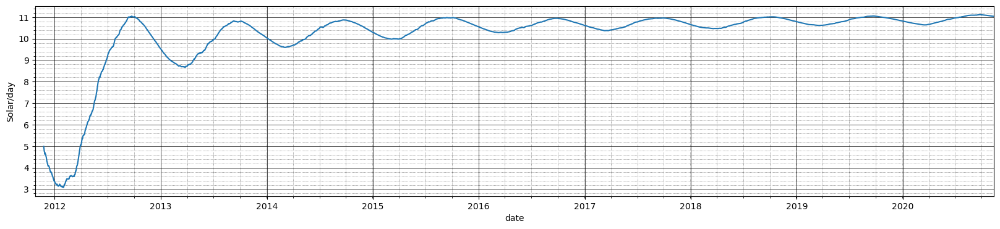

In [16]:
f, ax = plt.subplots(figsize=(20, 4))
data_expanding = df.expanding(min_periods=30).mean()

sns.lineplot(data=df, x="date", y=data_expanding["Solar/day"])

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xlim([datetime(2011,10,26), datetime(2020,11,10)]);

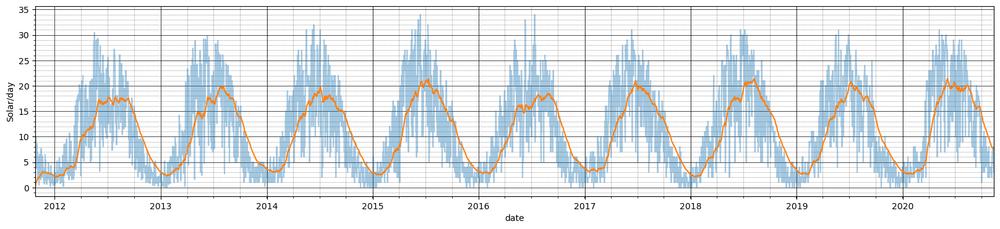

In [17]:
f, ax = plt.subplots(figsize=(20, 4))
data_ewm = df.ewm(com=30, adjust=False).mean()

sns.lineplot(data=df, x="date", y="Solar/day", alpha=0.4)
sns.lineplot(data=df, x="date", y=data_ewm["Solar/day"])

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xlim([datetime(2011,10,26), datetime(2020,11,10)]);

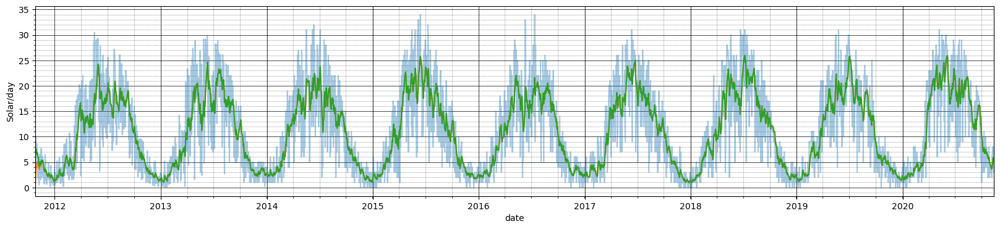

In [18]:
from statsmodels.tsa.holtwinters import SimpleExpSmoothing

span = 12
alpha = 2/(span+1)

df['EWMA12'] = df['Solar/day'].ewm(alpha=alpha, adjust=False).mean()
df['SES12'] = SimpleExpSmoothing(df['Solar/day'], initialization_method='estimated').fit(smoothing_level=alpha, optimized=False).fittedvalues.shift(-1)

f, ax = plt.subplots(figsize=(20, 4))

sns.lineplot(data=df, x="date", y="Solar/day", alpha=0.4)
sns.lineplot(data=df, x="date", y=df["EWMA12"])
sns.lineplot(data=df, x="date", y=df["SES12"])

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xlim([datetime(2011,10,26), datetime(2020,11,10)]);

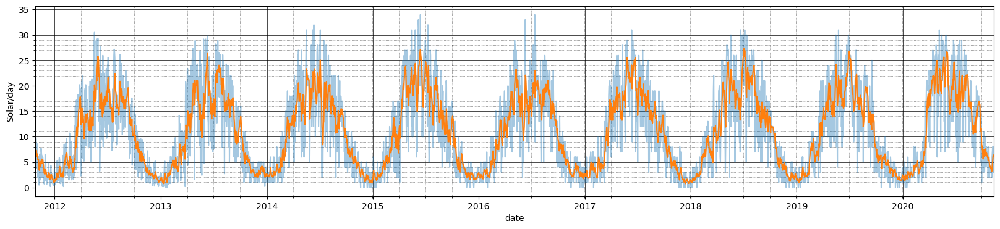

In [19]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing

df['DESadd12'] = ExponentialSmoothing(df['Solar/day'], initialization_method='estimated', trend='add').fit().fittedvalues.shift(-1)
# dataset['DESmul12'] = ExponentialSmoothing(df['Solar/day'], initialization_method='estimated', trend='mul').fit().fittedvalues.shift(-1)

f, ax = plt.subplots(figsize=(20, 4))

sns.lineplot(data=df, x="date", y="Solar/day", alpha=0.4)
sns.lineplot(data=df, x="date", y=df["DESadd12"])
# sns.lineplot(data=df, x="date", y=df["DESmul12"])

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xlim([datetime(2011,10,26), datetime(2020,11,10)]);

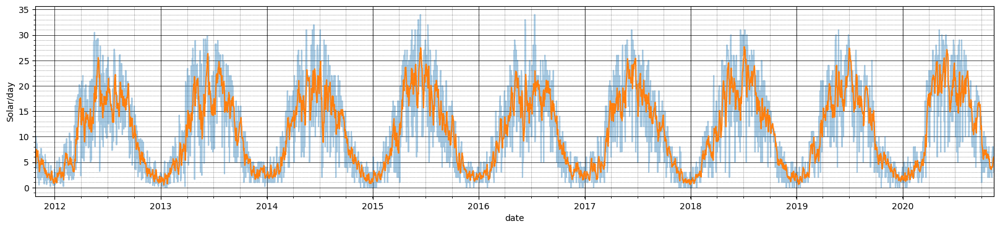

In [20]:
df['TESadd12'] = ExponentialSmoothing(df['Solar/day'], initialization_method='estimated', trend='add', seasonal='add', seasonal_periods=12).fit().fittedvalues
# dataset['TESmul12'] = ExponentialSmoothing(dataset['Solar/day'], initialization_method='estimated', trend='mul', seasonal='mul', seasonal_periods=12).fit().fittedvalues

f, ax = plt.subplots(figsize=(20, 4))

sns.lineplot(data=df, x="date", y="Solar/day", alpha=0.4)
sns.lineplot(data=df, x="date", y=df["TESadd12"])
# sns.lineplot(data=dataset, x="date", y=dataset["TESmul12"])

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xlim([datetime(2011,10,26), datetime(2020,11,10)]);

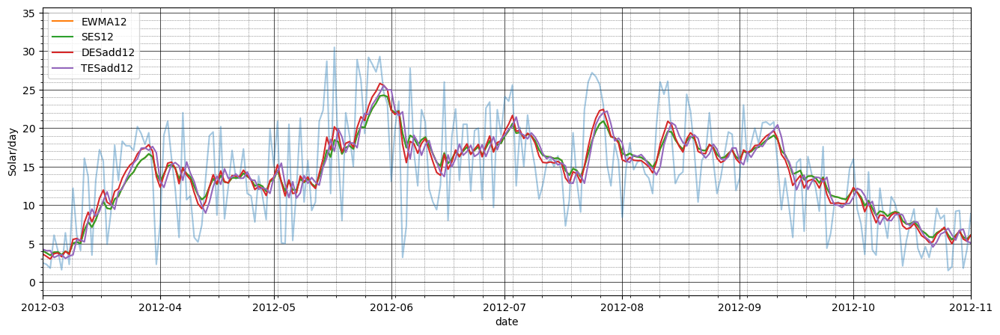

In [21]:
f, ax = plt.subplots(figsize=(16, 5))

sns.lineplot(data=df, x="date", y="Solar/day", alpha=0.4)
sns.lineplot(data=df, x="date", y=df["EWMA12"], label="EWMA12")
sns.lineplot(data=df, x="date", y=df["SES12"], label="SES12")
sns.lineplot(data=df, x="date", y=df["DESadd12"], label="DESadd12")
sns.lineplot(data=df, x="date", y=df["TESadd12"], label="TESadd12")

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xlim([datetime(2012,3,1), datetime(2012,11,1)])

ax.legend(loc='upper left');

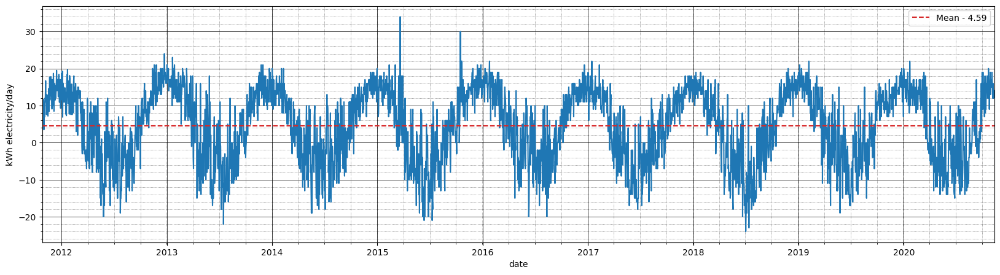

In [22]:
f, ax = plt.subplots(figsize=(20, 5))
sns.lineplot(data=df, x="date", y="kWh electricity/day")

mean_avg=df['kWh electricity/day'].mean()
ax.axhline(mean_avg, color='#d62728', linestyle='--', label=f"Mean - {mean_avg:.2f}")

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xlim([datetime(2011,10,26), datetime(2020,11,10)])

ax.legend();

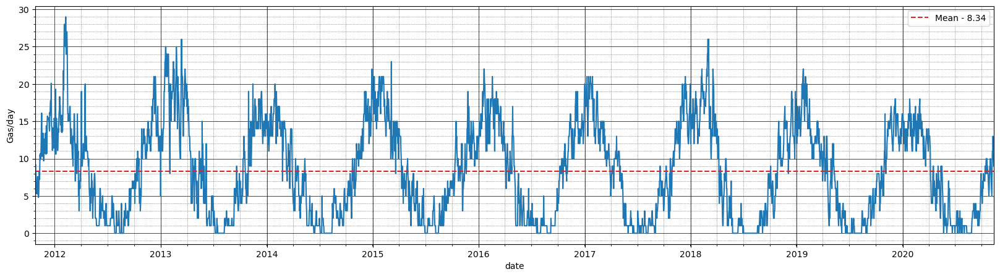

In [23]:
f, ax = plt.subplots(figsize=(20, 5))
sns.lineplot(data=df, x="date", y="Gas/day")

mean_avg=df['Gas/day'].mean()
ax.axhline(mean_avg, color='#d62728', linestyle='--', label=f"Mean - {mean_avg:.2f}")

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xlim([datetime(2011,10,26), datetime(2020,11,10)])

ax.legend();

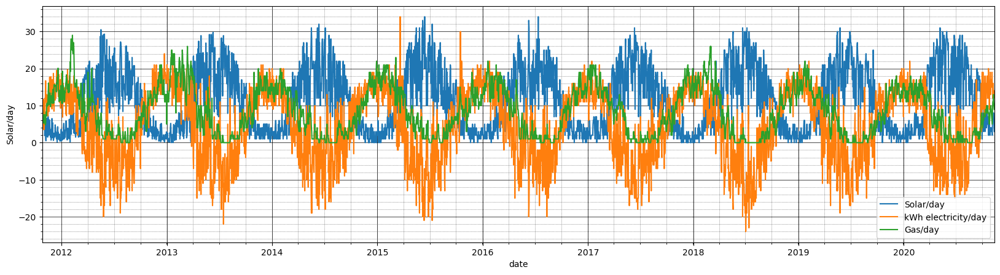

In [24]:
f, ax = plt.subplots(figsize=(20, 5))
sns.lineplot(data=df, x="date", y="Solar/day", label='Solar/day')
sns.lineplot(data=df, x="date", y="kWh electricity/day", label='kWh electricity/day')
sns.lineplot(data=df, x="date", y="Gas/day", label='Gas/day')

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xlim([datetime(2011,10,26), datetime(2020,11,10)])

ax.legend();

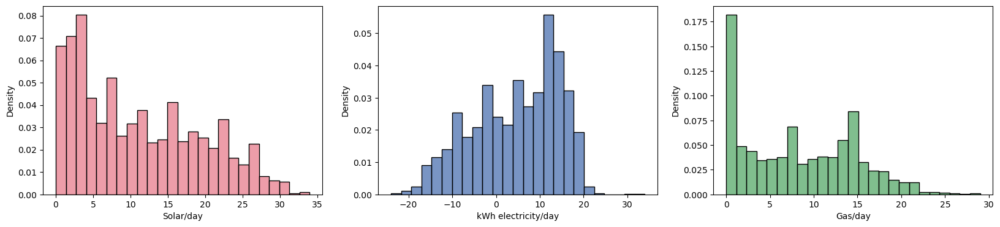

In [25]:
f, ax = plt.subplots(1,3,figsize=(20,4))
sns.histplot(df['Solar/day'], stat="density", bins=25, ax=ax[0], color="#e77c8d")
sns.histplot(df['kWh electricity/day'], stat="density", bins=25, ax=ax[1], color="#4c72b0")
sns.histplot(df['Gas/day'], stat="density", bins=25, ax=ax[2], color="#55a868");

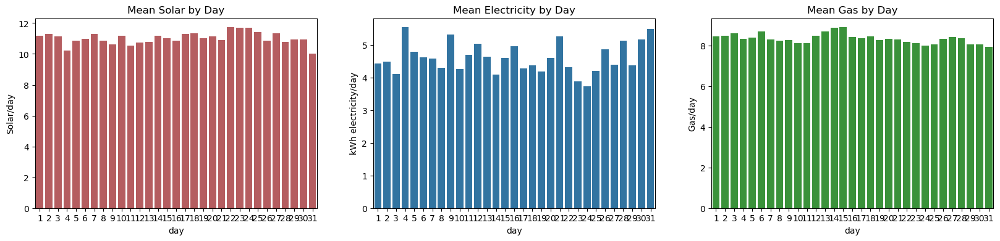

In [26]:
f, ax = plt.subplots(1,3,figsize=(20,4))
sns.barplot(x="day", y='Solar/day', data=df, color="#c44e52", ci=None, ax=ax[0])
ax[0].set_title('Mean Solar by Day')

sns.barplot(x="day", y='kWh electricity/day', data=df, color="#1f77b4", ci=None, ax=ax[1])
ax[1].set_title('Mean Electricity by Day')

sns.barplot(x="day", y='Gas/day', data=df, color="#2ca02c", ci=None, ax=ax[2])
ax[2].set_title('Mean Gas by Day');

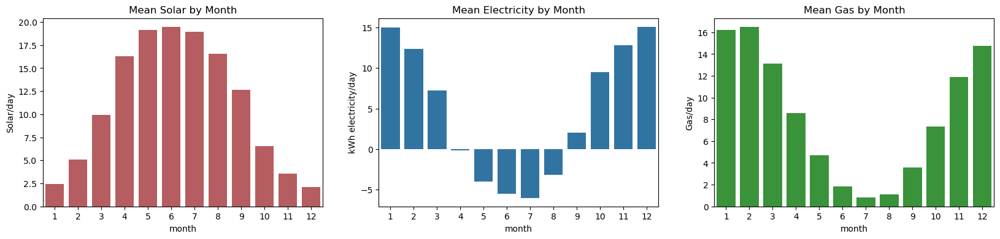

In [27]:
f, ax = plt.subplots(1,3,figsize=(20,4))
sns.barplot(x="month", y='Solar/day', data=df, color="#c44e52", ci=None, ax=ax[0])
ax[0].set_title('Mean Solar by Month')

sns.barplot(x="month", y='kWh electricity/day', data=df, color="#1f77b4", ci=None, ax=ax[1])
ax[1].set_title('Mean Electricity by Month')

sns.barplot(x="month", y='Gas/day', data=df, color="#2ca02c", ci=None, ax=ax[2])
ax[2].set_title('Mean Gas by Month');

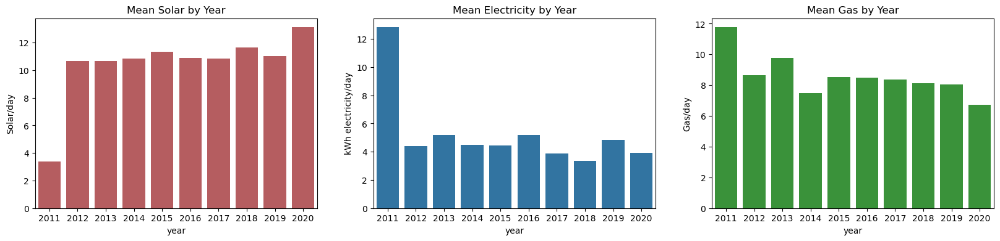

In [28]:
f, ax = plt.subplots(1,3,figsize=(20,4))
sns.barplot(x="year", y='Solar/day', data=df, color="#c44e52", ci=None, ax=ax[0])
ax[0].set_title('Mean Solar by Year')

sns.barplot(x="year", y='kWh electricity/day', data=df, color="#1f77b4", ci=None, ax=ax[1])
ax[1].set_title('Mean Electricity by Year')

sns.barplot(x="year", y='Gas/day', data=df, color="#2ca02c", ci=None, ax=ax[2])
ax[2].set_title('Mean Gas by Year');

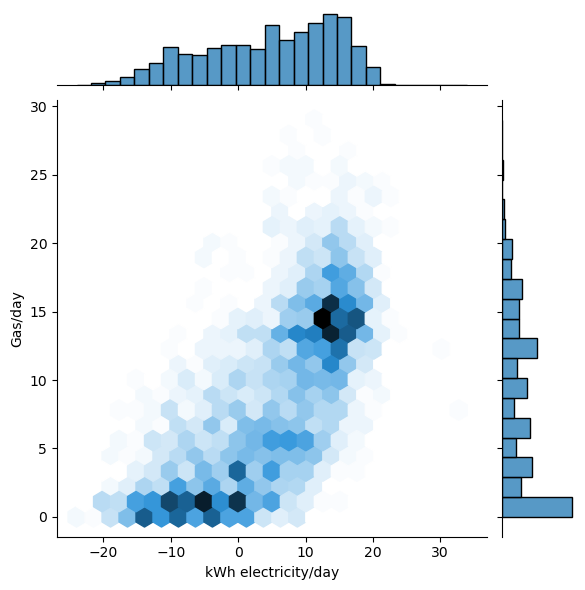

In [29]:
sns.jointplot(data=df, x='kWh electricity/day', y='Gas/day', kind='hex');

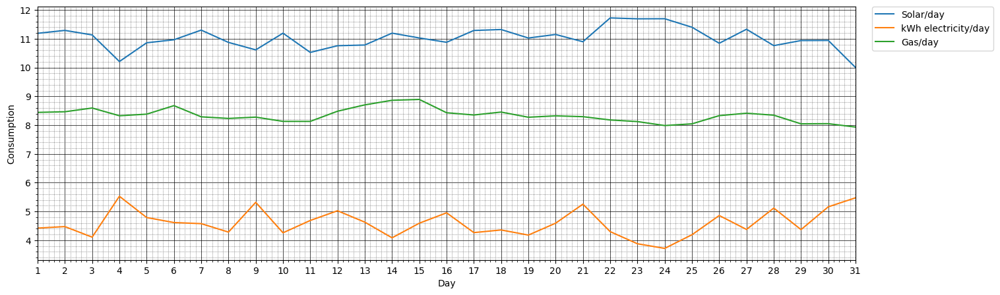

In [30]:
data_day=df[['kWh electricity/day', 'Gas/day', 'Solar/day', 'day']].groupby('day', as_index=False).mean()

f, ax = plt.subplots(figsize=(16, 5))
sns.lineplot(data=data_day, x="day", y='Solar/day', label='Solar/day')
sns.lineplot(data=data_day, x="day", y="kWh electricity/day", label='kWh electricity/day')
sns.lineplot(data=data_day, x="day", y="Gas/day", label='Gas/day')

ax.set_xlabel('Day')
ax.set_ylabel('Consumption')

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xticks(range(1,32))
ax.set_xlim([1, 31])

ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0);

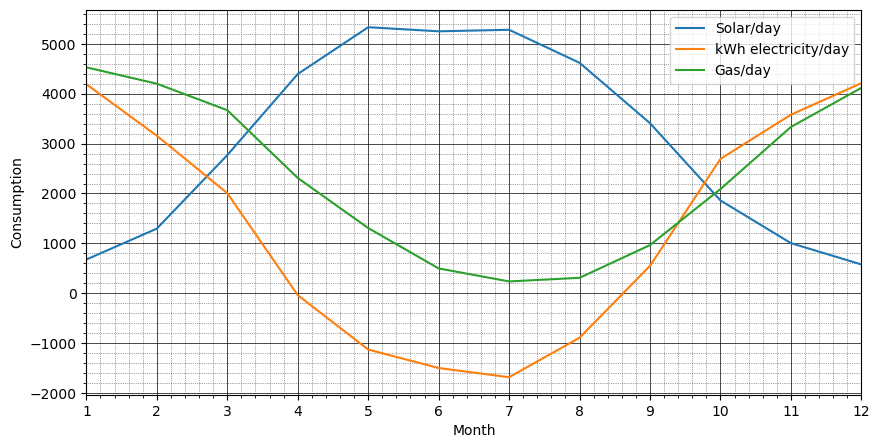

In [31]:
data_month=df[['kWh electricity/day', 'Gas/day', 'Solar/day', 'month']].groupby('month', as_index=False).sum()

f, ax = plt.subplots(figsize=(10, 5))
sns.lineplot(data=data_month, x="month", y='Solar/day', label='Solar/day')
sns.lineplot(data=data_month, x="month", y="kWh electricity/day", label='kWh electricity/day')
sns.lineplot(data=data_month, x="month", y="Gas/day", label='Gas/day')

ax.set_xlabel('Month')
ax.set_ylabel('Consumption')

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xticks(range(1,13))
ax.set_xlim([1, 12])

ax.legend();

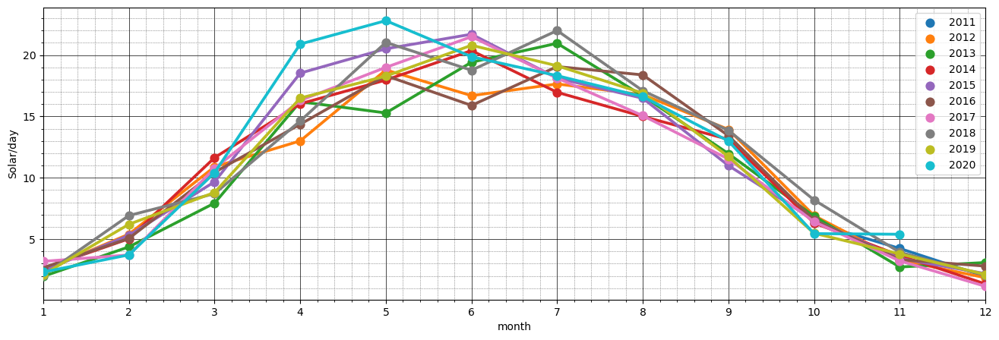

In [32]:
data_month=df[['Solar/day', 'month', 'year']].groupby(['month', 'year'], as_index=False).mean()

f, ax = plt.subplots(figsize=(16, 5))
sns.pointplot(data=data_month, x="month", y='Solar/day', hue='year', legend="full")

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xticks(range(0,12))
ax.set_xlim([0, 11])

ax.legend();

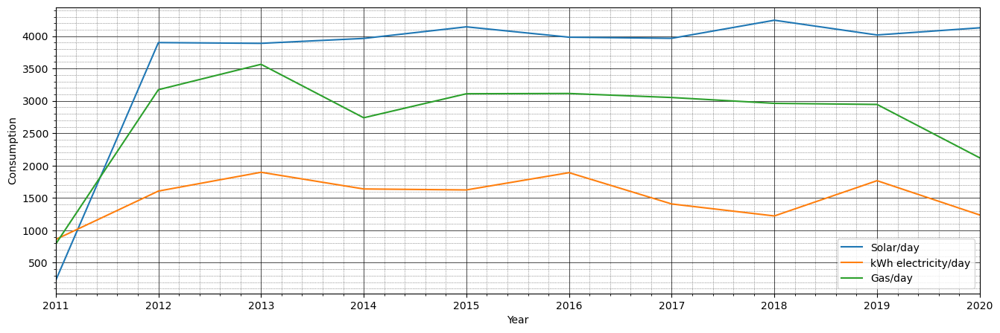

In [33]:
data_year=df[['kWh electricity/day', 'Gas/day', 'Solar/day', 'year']].groupby('year', as_index=False).sum()

f, ax = plt.subplots(figsize=(16, 5))
sns.lineplot(data=data_year, x="year", y='Solar/day', label='Solar/day')
sns.lineplot(data=data_year, x="year", y="kWh electricity/day", label='kWh electricity/day')
sns.lineplot(data=data_year, x="year", y="Gas/day", label='Gas/day')

ax.set_xlabel('Year')
ax.set_ylabel('Consumption')

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xlim([2011, 2020])

ax.legend();

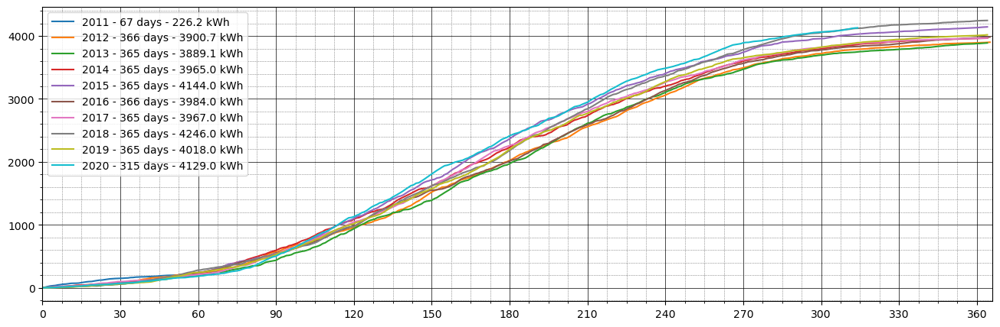

In [34]:
f, ax = plt.subplots(figsize=(16, 5))

for i in range(2011,2021):
    y=df[df['year']==i]['Solar/day'].cumsum()
    y_list=y.to_list()

    sns.lineplot(x=range(len(y_list)), y=y_list, label=f'{i} - {len(y_list)} days - {y_list[-1]:.1f} kWh')

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xticks(range(0, 366, 30))
ax.set_xlim([0, 366])

ax.legend();

In [35]:
train_data = df[:2600]
test_data = df[2600:]

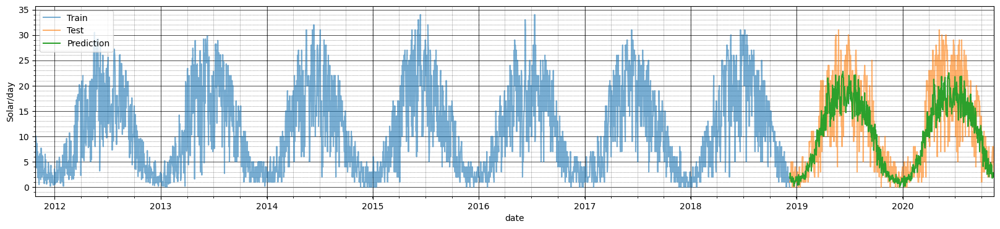

In [36]:
fitted_model = ExponentialSmoothing(train_data["Solar/day"], initialization_method='estimated', trend='add', seasonal='add', seasonal_periods=365).fit()

test_prediction = fitted_model.forecast(704)

f, ax = plt.subplots(figsize=(20, 4))

sns.lineplot(data=train_data, x="date", y="Solar/day", label='Train', alpha=0.6)
sns.lineplot(data=test_data, x="date", y="Solar/day", label='Test', alpha=0.6)
sns.lineplot(data=test_data, x="date", y=test_prediction, label='Prediction')

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xlim([datetime(2011,10,26), datetime(2020,11,10)]);

In [37]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, max_error, r2_score

print("r2_score: ", r2_score(test_data["Solar/day"], test_prediction))
print("mean_absolute_error: ", mean_absolute_error(test_data["Solar/day"], test_prediction))
print("mean_squared_error: ", mean_squared_error(test_data["Solar/day"], test_prediction))
print("root_mean_squared_error: ", mean_squared_error(test_data["Solar/day"], test_prediction, squared=False))
print("max_error: ", max_error(test_data["Solar/day"], test_prediction))

r2_score:  0.600426956188342
mean_absolute_error:  4.15117650787764
mean_squared_error:  29.550604015291643
root_mean_squared_error:  5.43604672673917
max_error:  16.312706557060665


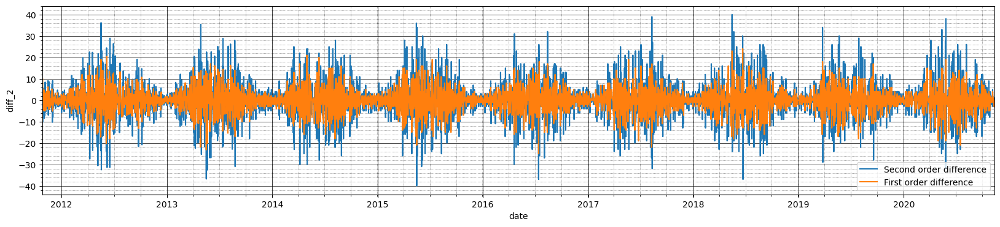

In [38]:
df["diff_1"] = df["Solar/day"].diff()
df["diff_2"] = df["Solar/day"].diff().diff()

f, ax = plt.subplots(figsize=(20, 4))

sns.lineplot(data=df, x="date", y="diff_2", label="Second order difference")
sns.lineplot(data=df, x="date", y="diff_1", label="First order difference")

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xlim([datetime(2011,10,26), datetime(2020,11,10)]);

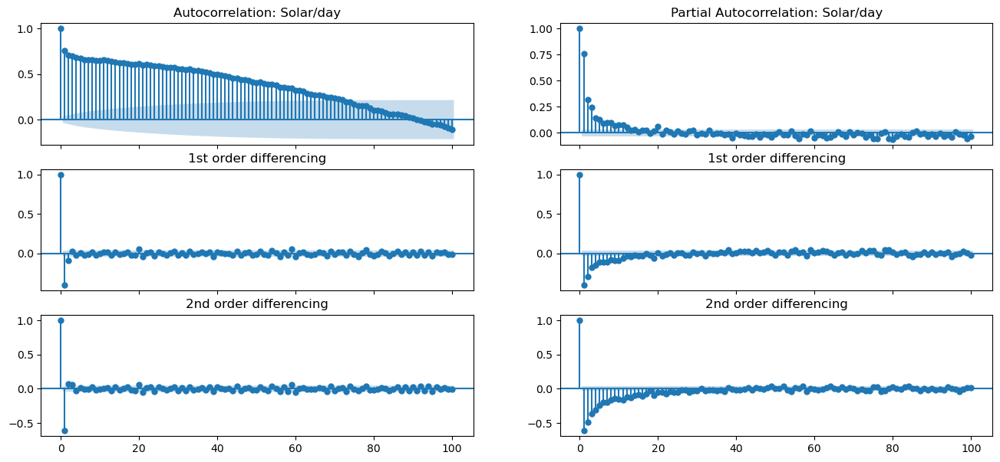

In [39]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.tools import diff

fig, axes = plt.subplots(3, 2, sharex=True, figsize = (16,7))
lags=100

plot_acf(df["Solar/day"], title='Autocorrelation: Solar/day', lags=lags, ax=axes[0][0])
plot_acf(diff(df["Solar/day"], k_diff=1), title='1st order differencing', lags=lags, ax=axes[1][0])
plot_acf(diff(df["Solar/day"], k_diff=2), title='2nd order differencing', lags=lags, ax=axes[2][0])

plot_pacf(df["Solar/day"], title='Partial Autocorrelation: Solar/day', lags=lags, ax=axes[0][1])
plot_pacf(diff(df["Solar/day"], k_diff=1), title='1st order differencing', lags=lags, ax=axes[1][1])
plot_pacf(diff(df["Solar/day"], k_diff=2), title='2nd order differencing', lags=lags, ax=axes[2][1]);

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


Lag: 27
Coefficients:
const                         0.187701
L1.Cumulative_solar_power     1.330780
L2.Cumulative_solar_power    -0.247987
L3.Cumulative_solar_power     0.032713
L4.Cumulative_solar_power    -0.069653
L5.Cumulative_solar_power     0.002285
L6.Cumulative_solar_power    -0.018027
L7.Cumulative_solar_power    -0.006936
L8.Cumulative_solar_power     0.012917
L9.Cumulative_solar_power    -0.020680
L10.Cumulative_solar_power    0.007462
L11.Cumulative_solar_power    0.031180
L12.Cumulative_solar_power   -0.015495
L13.Cumulative_solar_power   -0.029162
L14.Cumulative_solar_power    0.020805
L15.Cumulative_solar_power   -0.023038
L16.Cumulative_solar_power    0.022280
L17.Cumulative_solar_power   -0.029301
L18.Cumulative_solar_power    0.010098
L19.Cumulative_solar_power   -0.032024
L20.Cumulative_solar_power    0.095737
L21.Cumulative_solar_power   -0.091299
L22.Cumulative_solar_power    0.053256
L23.Cumulative_solar_power   -0.023733
L24.Cumulative_solar_power   -0.033267
L25

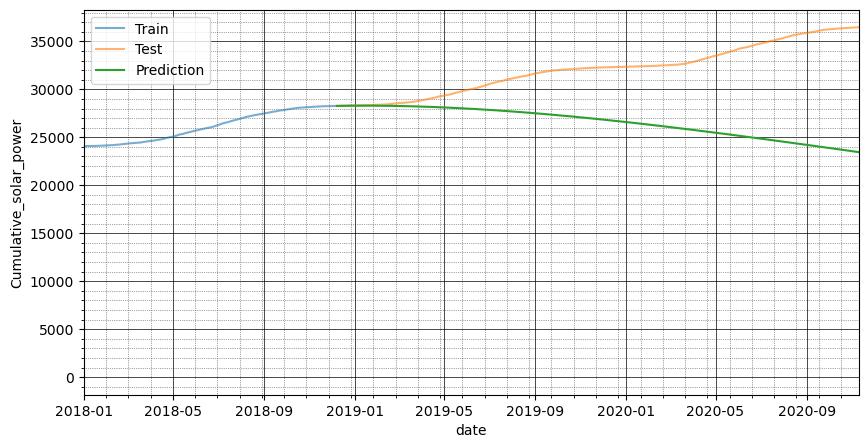

In [40]:
from statsmodels.tsa.ar_model import AR, ARResults

AR_model = AR(train_data["Cumulative_solar_power"]).fit(maxlag=27, method='mle')
AR_pred = AR_model.predict(start=len(train_data), end=len(train_data)+len(test_data)-1, dynamic=False)

print(f'Lag: {AR_model.k_ar}')
print(f'Coefficients:\n{AR_model.params}')

f, ax = plt.subplots(figsize=(10, 5))

sns.lineplot(data=train_data, x="date", y="Cumulative_solar_power", label='Train', alpha=0.6)
sns.lineplot(data=test_data, x="date", y="Cumulative_solar_power", label='Test', alpha=0.6)
sns.lineplot(data=test_data, x="date", y=AR_pred, label='Prediction')

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xlim([datetime(2018,1,1), datetime(2020,11,10)]);

In [41]:
from statsmodels.tsa.stattools import grangercausalitytests

grangercausalitytests(df[["Solar/day", "Cumulative_solar_power"]], maxlag=3);


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.3169  , p=0.1281  , df_denom=3300, df_num=1
ssr based chi2 test:   chi2=2.3190  , p=0.1278  , df=1
likelihood ratio test: chi2=2.3182  , p=0.1279  , df=1
parameter F test:         F=2.3169  , p=0.1281  , df_denom=3300, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.5372  , p=0.5844  , df_denom=3298, df_num=2
ssr based chi2 test:   chi2=1.0757  , p=0.5840  , df=2
likelihood ratio test: chi2=1.0755  , p=0.5840  , df=2
parameter F test:         F=495.9431, p=0.0000  , df_denom=3298, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.1788  , p=0.9108  , df_denom=3296, df_num=3
ssr based chi2 test:   chi2=0.5371  , p=0.9107  , df=3
likelihood ratio test: chi2=0.5371  , p=0.9107  , df=3
parameter F test:         F=455.0839, p=0.0000  , df_denom=3296, df_num=3


In [42]:
!pip install pmdarima

In [43]:
from pmdarima import auto_arima

auto_arima(df["Solar/day"], error_action='ignore').summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 3304
Model:               SARIMAX(2, 0, 1)   Log Likelihood               -9847.932
Date:                Thu, 03 Feb 2022   AIC                          19705.864
Time:                        22:42:58   BIC                          19736.378
Sample:                             0   HQIC                         19716.786
                               - 3304                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0655      0.036      1.835      0.067      -0.004       0.136
ar.L1          1.1922      0.018     65.612      0.000       1.157       1.228
ar.L2         -0.1984      0.017    -11.353      0.000      -0.233      -0.164
ma.L1         -0.8558      0.011    -79.983      0.000      -0.877      -0.835
sigma2        22.7097      0.492     46.146      0.000      21.745      23.674
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):               111.28
Prob(Q):                              0.89   Prob(JB):                         0.00
Heteroskedasticity (H):               0.92   Skew:                            -0.06
Prob(H) (two-sided):                  0.17   Kurtosis:                         3.89
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [44]:
auto_arima(df['Cumulative_solar_power'], start_p=0, start_q=0, max_p=4, max_q=3, m=12, seasonal=True, d=None, trace=True, error_action='ignore', suppress_warnings=True, stepwise=True).summary()

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=21227.562, Time=4.14 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=23350.792, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=20470.867, Time=2.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=21340.289, Time=2.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26717.835, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=20516.680, Time=0.17 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=20444.732, Time=13.78 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=20387.584, Time=24.56 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=20389.457, Time=3.76 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=45.01 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=20386.224, Time=24.12 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=20467.504, Time=10.70 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=20478.437, Time=1.47 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=21193.051, Time=29.99 sec
 ARIM

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                                    y   No. Observations:                 3304
Model:             SARIMAX(4, 1, 0)x(1, 0, [1], 12)   Log Likelihood               -9939.256
Date:                              Thu, 03 Feb 2022   AIC                          19894.513
Time:                                      22:57:31   BIC                          19943.333
Sample:                                           0   HQIC                         19911.988
                                             - 3304                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.3333      0.180      1.850      0.064      -0.020       0.686
ar.L1          0.3984      0.015     26.729      0.000       0.369       0.428
ar.L2          0.1555      0.014     10.790      0.000       0.127       0.184
ar.L3          0.1801      0.015     12.125      0.000       0.151       0.209
ar.L4          0.1407      0.014      9.971      0.000       0.113       0.168
ar.S.L12       0.7547      0.122      6.179      0.000       0.515       0.994
ma.S.L12      -0.7149      0.129     -5.561      0.000      -0.967      -0.463
sigma2        24.1032      0.543     44.372      0.000      23.039      25.168
===================================================================================
Ljung-Box (L1) (Q):                   0.87   Jarque-Bera (JB):               141.84
Prob(Q):                              0.35   Prob(JB):                         0.00
Heteroskedasticity (H):               0.94   Skew:                             0.12
Prob(H) (two-sided):                  0.29   Kurtosis:                         3.99
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [45]:
auto_arima(df['Cumulative_solar_power'], seasonal=True).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 3304
Model:               SARIMAX(2, 1, 1)   Log Likelihood               -9844.191
Date:                Thu, 03 Feb 2022   AIC                          19698.381
Time:                        22:57:43   BIC                          19728.894
Sample:                             0   HQIC                         19709.303
                               - 3304                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0664      0.040      1.652      0.098      -0.012       0.145
ar.L1          1.1922      0.018     65.277      0.000       1.156       1.228
ar.L2         -0.1984      0.017    -11.339      0.000      -0.233      -0.164
ma.L1         -0.8555      0.011    -79.670      0.000      -0.877      -0.834
sigma2        22.6996      0.495     45.899      0.000      21.730      23.669
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):               111.96
Prob(Q):                              0.90   Prob(JB):                         0.00
Heteroskedasticity (H):               0.92   Skew:                            -0.06
Prob(H) (two-sided):                  0.18   Kurtosis:                         3.89
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

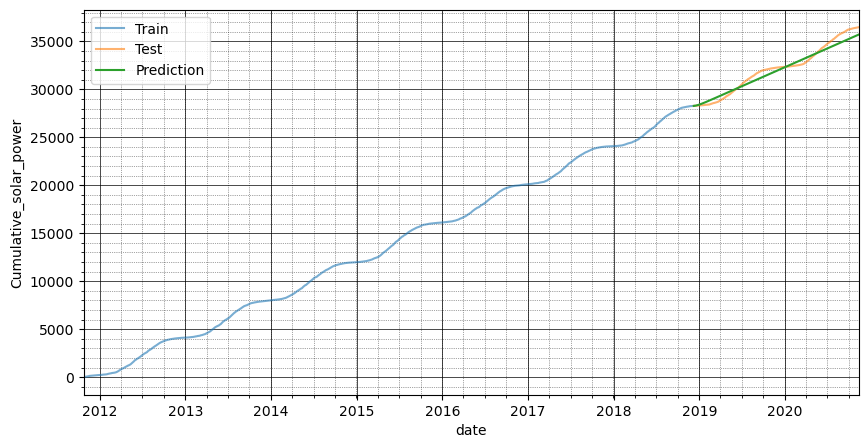

In [46]:
from statsmodels.tsa.arima_model import ARIMA,ARIMAResults

arima_model = ARIMA(train_data["Cumulative_solar_power"], order=(4,1,0)).fit()
arima_model.summary()

arima_pred = arima_model.predict(start=len(train_data), end=len(train_data)+len(test_data)-1, dynamic=False, typ='levels')

f, ax = plt.subplots(figsize=(10, 5))

sns.lineplot(data=train_data, x="date", y="Cumulative_solar_power", label='Train', alpha=0.6)
sns.lineplot(data=test_data, x="date", y="Cumulative_solar_power", label='Test', alpha=0.6)
sns.lineplot(data=test_data, x="date", y=arima_pred, label='Prediction')

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xlim([datetime(2011,10,26), datetime(2020,11,10)]);

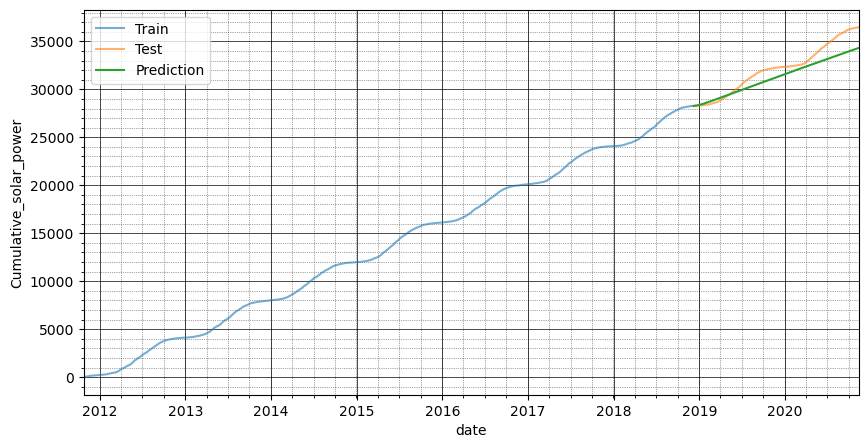

In [47]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

sarimax_model = SARIMAX(train_data["Cumulative_solar_power"], order=(4,1,0), seasonal_order=(1,0,1,12)).fit()
sarimax_model.summary()

sarimax_pred = sarimax_model.predict(start=len(train_data), end=len(train_data)+len(test_data)-1, dynamic=False, typ='levels')

f, ax = plt.subplots(figsize=(10, 5))

sns.lineplot(data=train_data, x="date", y="Cumulative_solar_power", label='Train', alpha=0.6)
sns.lineplot(data=test_data, x="date", y="Cumulative_solar_power", label='Test', alpha=0.6)
sns.lineplot(data=test_data, x="date", y=sarimax_pred, label='Prediction')

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xlim([datetime(2011,10,26), datetime(2020,11,10)]);

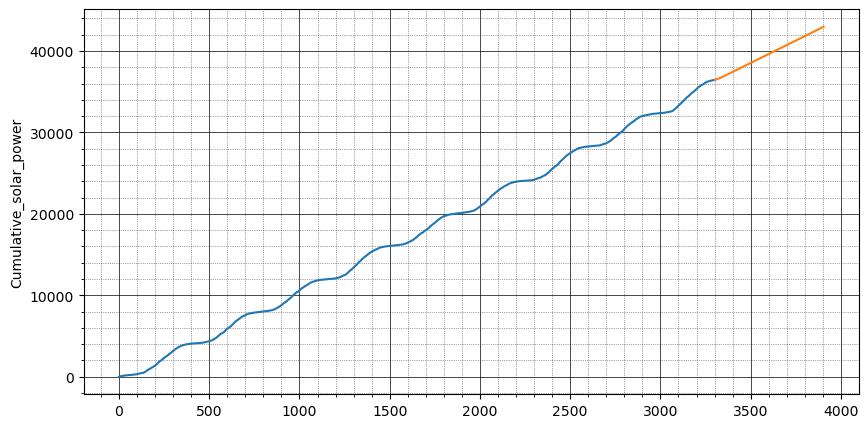

In [48]:
arima_model = ARIMA(df["Cumulative_solar_power"], order=(4,1,0)).fit()
arima_model.summary()

arima_pred = arima_model.predict(start=len(df["Cumulative_solar_power"]), end=len(df["Cumulative_solar_power"])+600, dynamic=False, typ='levels')

f, ax = plt.subplots(figsize=(10, 5))

len_d=len(df["Cumulative_solar_power"])
sns.lineplot(x=range(len_d), y=df["Cumulative_solar_power"])
sns.lineplot(x=range(len_d,len_d+601), y=arima_pred)

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

In [49]:
data_fb = df.copy()
data_fb = data_fb.rename(columns={'date':'ds','Cumulative_solar_power':'y'})

train_fb = data_fb[:2600]
test_fb = data_fb[2600:]

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


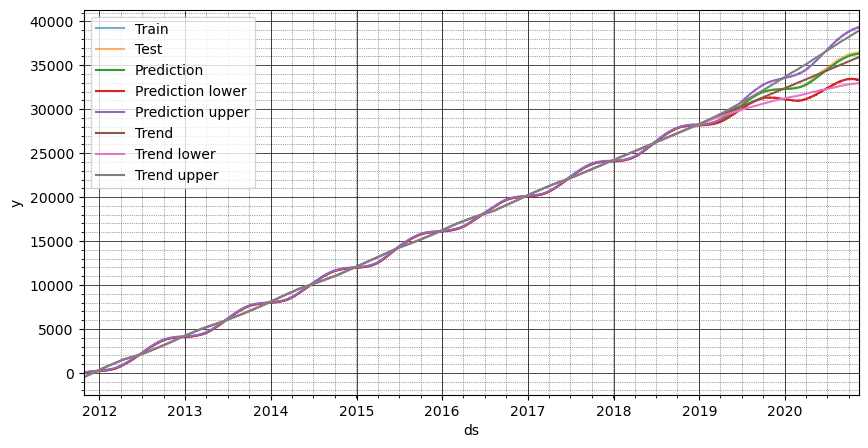

In [50]:
from fbprophet import Prophet

model_fb = Prophet().fit(train_fb)
future = model_fb.make_future_dataframe(periods=704)
forecast_fb = model_fb.predict(future)

f, ax = plt.subplots(figsize=(10, 5))

sns.lineplot(data=train_fb, x="ds", y="y", label='Train', alpha=0.6)
sns.lineplot(data=test_fb, x="ds", y="y", label='Test', alpha=0.6)

sns.lineplot(data=forecast_fb, x="ds", y='yhat', label='Prediction')
sns.lineplot(data=forecast_fb, x="ds", y='yhat_lower', label='Prediction lower')
sns.lineplot(data=forecast_fb, x="ds", y='yhat_upper', label='Prediction upper')

sns.lineplot(data=forecast_fb, x="ds", y='trend', label='Trend')
sns.lineplot(data=forecast_fb, x="ds", y='trend_lower', label='Trend lower')
sns.lineplot(data=forecast_fb, x="ds", y='trend_upper', label='Trend upper')

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xlim([datetime(2011,10,26), datetime(2020,11,10)]);

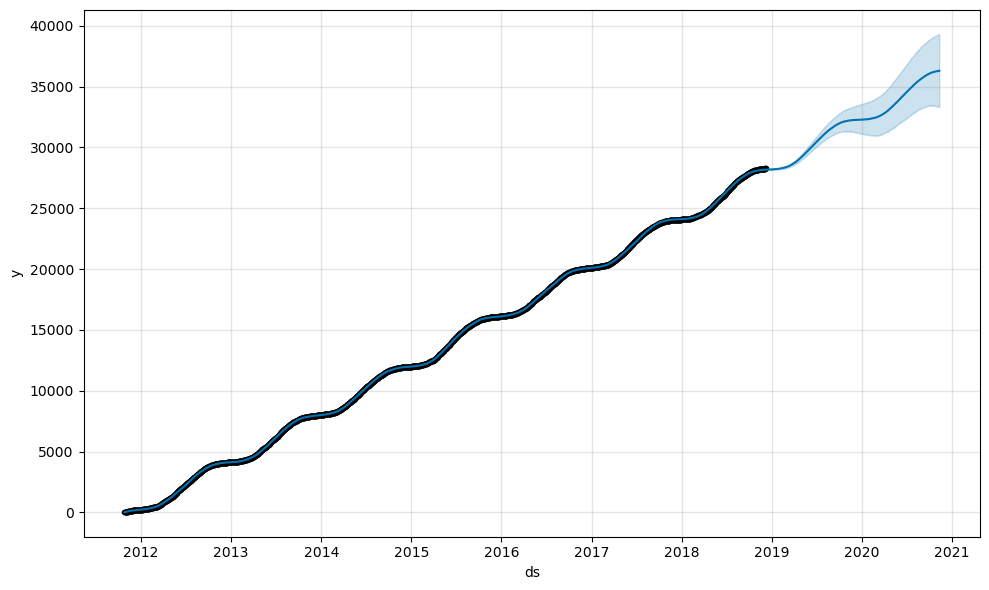

In [51]:
fig = model_fb.plot(forecast_fb)

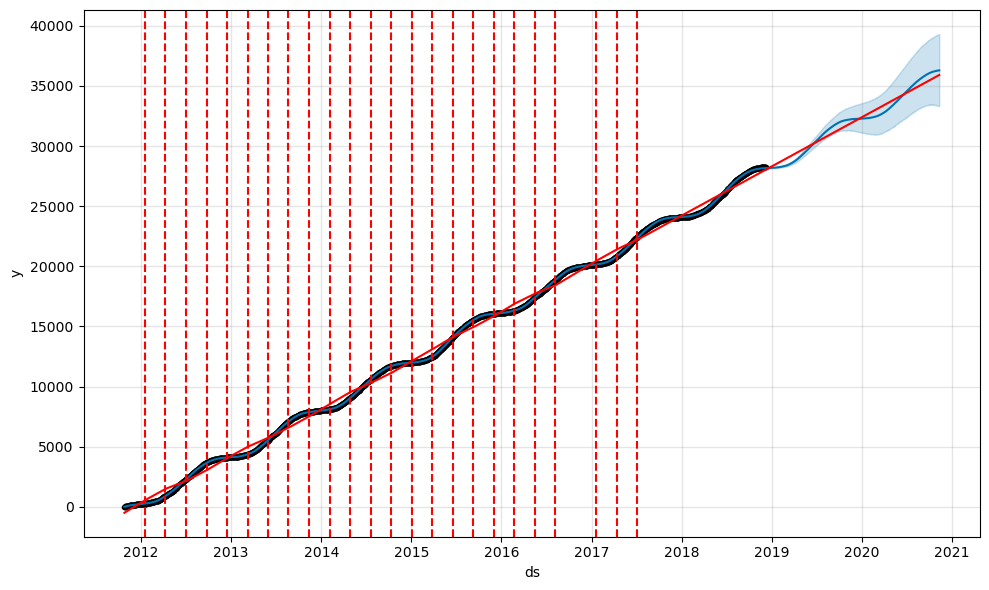

In [52]:
from fbprophet.plot import add_changepoints_to_plot

fig = model_fb.plot(forecast_fb)
a = add_changepoints_to_plot(fig.gca(), model_fb, forecast_fb)

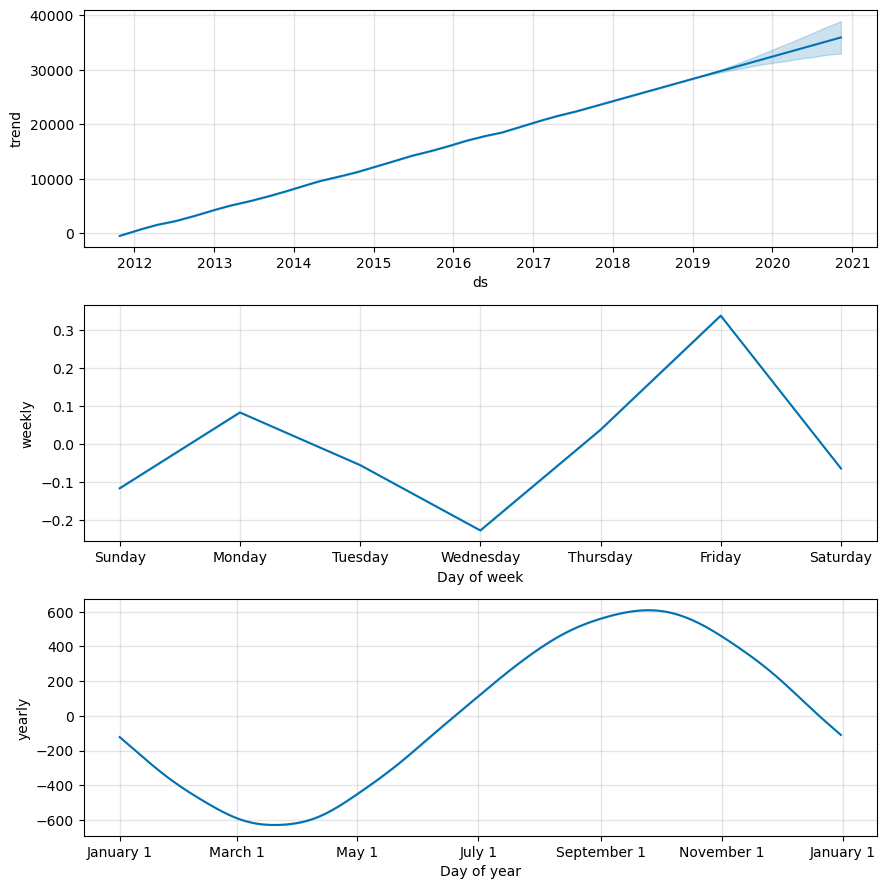

In [53]:
fig = model_fb.plot_components(forecast_fb)

In [54]:
from fbprophet.plot import plot_plotly, plot_components_plotly

plot_plotly(model_fb, forecast_fb)

In [55]:
data_fb = df.copy()
data_fb = data_fb.rename(columns={'date':'ds','Solar/day':'y'})

train_fb = data_fb[:2600]
test_fb = data_fb[2600:]

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


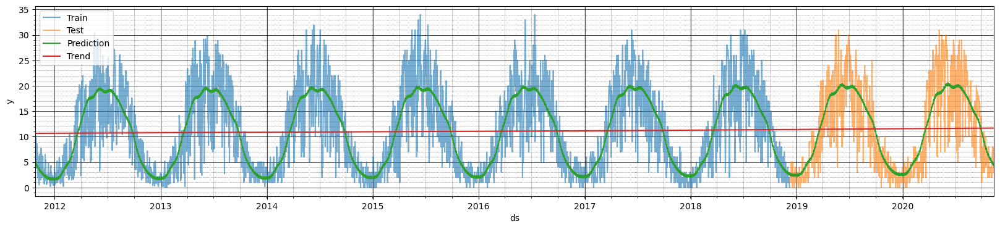

In [56]:
model_fb = Prophet().fit(train_fb)
future = model_fb.make_future_dataframe(periods=704)
forecast_fb = model_fb.predict(future)

f, ax = plt.subplots(figsize=(20, 4))

sns.lineplot(data=train_fb, x="ds", y="y", label='Train', alpha=0.6)
sns.lineplot(data=test_fb, x="ds", y="y", label='Test', alpha=0.6)
sns.lineplot(data=forecast_fb, x="ds", y='yhat', label='Prediction')
sns.lineplot(data=forecast_fb, x="ds", y='trend', label='Trend')

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xlim([datetime(2011,10,26), datetime(2020,11,10)]);

In [57]:
plot_plotly(model_fb, forecast_fb)

In [58]:
from sklearn.ensemble import RandomForestRegressor


def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = pd.DataFrame(data)
    cols = list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
    agg = pd.concat(cols, axis=1)
    if dropnan:
        agg.dropna(inplace=True)
        
    return agg.values


def train_test_split(data, n_test):
    return data[:-n_test, :], data[-n_test:, :]


def random_forest_forecast(train, testX):
    train = np.asarray(train)
    trainX, trainy = train[:, :-1], train[:, -1]

    model = RandomForestRegressor(n_estimators=1000)
    model.fit(trainX, trainy)

    yhat = model.predict([testX])
    return yhat[0]

def walk_forward_validation(data, n_test):
    predictions = list()
    
    train, test = train_test_split(data, n_test)
    
    history = [x for x in train]

    for i in range(len(test)):
        testX, testy = test[i, :-1], test[i, -1]
        
        yhat = random_forest_forecast(history, testX)
        
        predictions.append(yhat)
        history.append(test[i])
        
        print(f'{i}: expected={testy:.1f}, predicted={yhat:.1f}')

    error = mean_absolute_error(test[:, -1], predictions)
    return error, test[:, -1], predictions

In [59]:
data_ml = df[['date','Cumulative_solar_power']].copy()
data_ml.set_index('date', inplace=True)

values = data_ml.values

data = series_to_supervised(values, n_in=7)
print(data.shape)
print(data)

(3297, 8)
[[1.0000e-01 1.0200e+01 2.0200e+01 ... 3.8000e+01 4.6600e+01 5.1600e+01]
 [1.0200e+01 2.0200e+01 2.9600e+01 ... 4.6600e+01 5.1600e+01 5.8600e+01]
 [2.0200e+01 2.9600e+01 3.4200e+01 ... 5.1600e+01 5.8600e+01 6.0500e+01]
 ...
 [3.6419e+04 3.6422e+04 3.6424e+04 ... 3.6445e+04 3.6453e+04 3.6461e+04]
 [3.6422e+04 3.6424e+04 3.6430e+04 ... 3.6453e+04 3.6461e+04 3.6466e+04]
 [3.6424e+04 3.6430e+04 3.6437e+04 ... 3.6461e+04 3.6466e+04 3.6469e+04]]


In [60]:
mae, y, yhat = walk_forward_validation(data, 30)
print(f'MAE: {mae:.3f}')

0: expected=36323.0, predicted=36309.2
1: expected=36332.0, predicted=36318.2
2: expected=36336.0, predicted=36326.7
3: expected=36341.0, predicted=36333.0
4: expected=36349.0, predicted=36338.2
5: expected=36354.0, predicted=36345.0
6: expected=36360.0, predicted=36350.7
7: expected=36365.0, predicted=36356.6
8: expected=36372.0, predicted=36362.2
9: expected=36374.0, predicted=36368.0
10: expected=36380.0, predicted=36372.0
11: expected=36385.0, predicted=36376.8
12: expected=36393.0, predicted=36381.9
13: expected=36396.0, predicted=36388.9
14: expected=36398.0, predicted=36393.2
15: expected=36402.0, predicted=36396.5
16: expected=36405.0, predicted=36400.1
17: expected=36409.0, predicted=36403.0
18: expected=36412.0, predicted=36406.7
19: expected=36415.0, predicted=36410.2
20: expected=36419.0, predicted=36413.3
21: expected=36422.0, predicted=36417.0
22: expected=36424.0, predicted=36420.1
23: expected=36430.0, predicted=36422.5
24: expected=36437.0, predicted=36427.4
25: expect

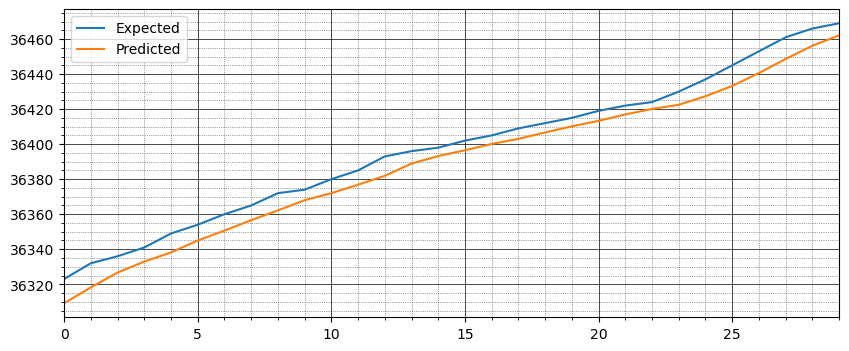

In [61]:
f, ax = plt.subplots(figsize=(10, 4))

sns.lineplot(x=range(len(y)), y=y, label='Expected')
sns.lineplot(x=range(len(y)), y=yhat, label='Predicted')

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_xlim([0, len(y)-1]);

In [62]:
future = values

train = series_to_supervised(values, n_in=7)
trainX, trainy = train[:, :-1], train[:, -1]
model = RandomForestRegressor(n_estimators=1000)
model.fit(trainX, trainy)

row = values[-7:].flatten()
yhat = model.predict(np.asarray([row]))
print('Input: %s, Predicted: %.3f' % (row, yhat))

steps=100
for i in range(steps):
    future=np.append(future, [[yhat[0]]], axis=0)
    row = future[-7:].flatten()
    yhat = model.predict(np.asarray([row]))
    print('Input: %s, Predicted: %.3f' % (row, yhat))

Input: [36430. 36437. 36445. 36453. 36461. 36466. 36469.], Predicted: 36466.699
Input: [36437.    36445.    36453.    36461.    36466.    36469.    36466.699], Predicted: 36466.699
Input: [36445.    36453.    36461.    36466.    36469.    36466.699 36466.699], Predicted: 36466.699
Input: [36453.    36461.    36466.    36469.    36466.699 36466.699 36466.699], Predicted: 36466.699
Input: [36461.    36466.    36469.    36466.699 36466.699 36466.699 36466.699], Predicted: 36466.699
Input: [36466.    36469.    36466.699 36466.699 36466.699 36466.699 36466.699], Predicted: 36466.699
Input: [36469.    36466.699 36466.699 36466.699 36466.699 36466.699 36466.699], Predicted: 36466.699
Input: [36466.699 36466.699 36466.699 36466.699 36466.699 36466.699 36466.699], Predicted: 36466.699
Input: [36466.699 36466.699 36466.699 36466.699 36466.699 36466.699 36466.699], Predicted: 36466.699
Input: [36466.699 36466.699 36466.699 36466.699 36466.699 36466.699 36466.699], Predicted: 36466.699
Input: [364

Input: [36466.699 36466.699 36466.699 36466.699 36466.699 36466.699 36466.699], Predicted: 36466.699
Input: [36466.699 36466.699 36466.699 36466.699 36466.699 36466.699 36466.699], Predicted: 36466.699
Input: [36466.699 36466.699 36466.699 36466.699 36466.699 36466.699 36466.699], Predicted: 36466.699
Input: [36466.699 36466.699 36466.699 36466.699 36466.699 36466.699 36466.699], Predicted: 36466.699
Input: [36466.699 36466.699 36466.699 36466.699 36466.699 36466.699 36466.699], Predicted: 36466.699
Input: [36466.699 36466.699 36466.699 36466.699 36466.699 36466.699 36466.699], Predicted: 36466.699
Input: [36466.699 36466.699 36466.699 36466.699 36466.699 36466.699 36466.699], Predicted: 36466.699
Input: [36466.699 36466.699 36466.699 36466.699 36466.699 36466.699 36466.699], Predicted: 36466.699
Input: [36466.699 36466.699 36466.699 36466.699 36466.699 36466.699 36466.699], Predicted: 36466.699
Input: [36466.699 36466.699 36466.699 36466.699 36466.699 36466.699 36466.699], Predicted: 

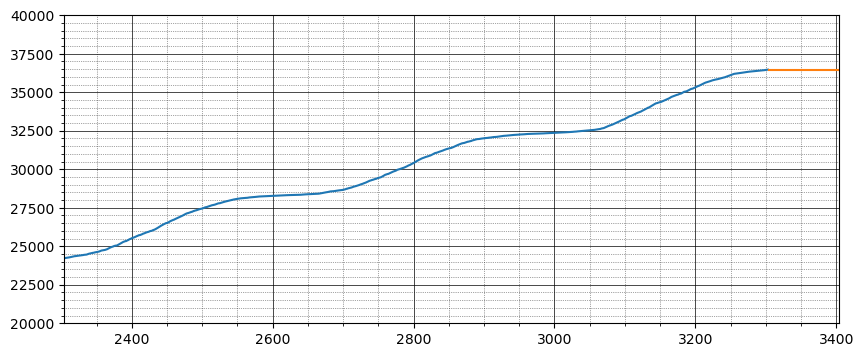

In [63]:
f, ax = plt.subplots(figsize=(10, 4))

sns.lineplot(x=range(len(values.flatten())), y=values.flatten())
sns.lineplot(x=range(len(values.flatten()), len(future.flatten())), y=future.flatten()[-steps:]);

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_ylim(20000, 40000)
ax.set_xlim([len(values.flatten())-1000, len(values.flatten())+steps]);

In [64]:
from tsfresh import extract_features, extract_relevant_features, select_features
from tsfresh.utilities.dataframe_functions import impute, make_forecasting_frame
from tsfresh.feature_extraction import ComprehensiveFCParameters, settings

data_ts = df[['date','Cumulative_solar_power']].copy()

data_ts.index = data_ts['date']
df_air = data_ts.drop(['date'], axis = 1)

df_shift, y_air = make_forecasting_frame(df_air["Cumulative_solar_power"], kind="Cumulative_solar_power", 
                                         max_timeshift=12, rolling_direction=1)
print(df_shift)

INFO:numba.cuda.cudadrv.driver:init
Rolling: 100%|█████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.77it/s]


                              id       time    value                    kind
1      (id, 2011-10-27 00:00:00) 2011-10-26      0.1  Cumulative_solar_power
3      (id, 2011-10-28 00:00:00) 2011-10-26      0.1  Cumulative_solar_power
4      (id, 2011-10-28 00:00:00) 2011-10-27     10.2  Cumulative_solar_power
6      (id, 2011-10-29 00:00:00) 2011-10-26      0.1  Cumulative_solar_power
7      (id, 2011-10-29 00:00:00) 2011-10-27     10.2  Cumulative_solar_power
...                          ...        ...      ...                     ...
42868  (id, 2020-11-10 00:00:00) 2020-11-05  36437.0  Cumulative_solar_power
42869  (id, 2020-11-10 00:00:00) 2020-11-06  36445.0  Cumulative_solar_power
42870  (id, 2020-11-10 00:00:00) 2020-11-07  36453.0  Cumulative_solar_power
42871  (id, 2020-11-10 00:00:00) 2020-11-08  36461.0  Cumulative_solar_power
42872  (id, 2020-11-10 00:00:00) 2020-11-09  36466.0  Cumulative_solar_power

[39570 rows x 4 columns]


In [65]:
extraction_settings = ComprehensiveFCParameters()
X = extract_features(df_shift, column_id="id", column_sort="time", column_value="value", impute_function=impute,
                     show_warnings=False, default_fc_parameters=extraction_settings)
X.head()

Feature Extraction: 100%|██████████████████████████████████████████████████████████████| 15/15 [00:53<00:00,  3.57s/it]


value__variance_larger_than_standard_deviation  \
id 2011-10-27                                             0.0   
   2011-10-28                                             1.0   
   2011-10-29                                             1.0   
   2011-10-30                                             1.0   
   2011-10-31                                             1.0   

               value__has_duplicate_max  value__has_duplicate_min  \
id 2011-10-27                       0.0                       0.0   
   2011-10-28                       0.0                       0.0   
   2011-10-29                       0.0                       0.0   
   2011-10-30                       0.0                       0.0   
   2011-10-31                       0.0                       0.0   

               value__has_duplicate  value__sum_values  value__abs_energy  \
id 2011-10-27                   0.0                0.1               0.01   
   2011-10-28                   0.0               10.3             104.05   
   2011-10-29                   0.0               30.5             512.09   
   2011-10-30                   0.0               60.1            1388.25   
   2011-10-31                   0.0               94.3            2557.89   

               value__mean_abs_change  value__mean_change  \
id 2011-10-27               11.545455           11.545455   
   2011-10-28               10.100000           10.100000   
   2011-10-29               10.050000           10.050000   
   2011-10-30                9.833333            9.833333   
   2011-10-31                8.525000            8.525000   

               value__mean_second_derivative_central  value__median  ...  \
id 2011-10-27                               0.000000           0.10  ...   
   2011-10-28                               0.000000           5.15  ...   
   2011-10-29                              -0.050000          10.20  ...   
   2011-10-30                              -0.175000          15.20  ...   
   2011-10-31                              -0.916667          20.20  ...   

               value__permutation_entropy__dimension_5__tau_1  \
id 2011-10-27                                             0.0   
   2011-10-28                                             0.0   
   2011-10-29                                             0.0   
   2011-10-30                                             0.0   
   2011-10-31                                            -0.0   

               value__permutation_entropy__dimension_6__tau_1  \
id 2011-10-27                                             0.0   
   2011-10-28                                             0.0   
   2011-10-29                                             0.0   
   2011-10-30                                             0.0   
   2011-10-31                                             0.0   

               value__permutation_entropy__dimension_7__tau_1  \
id 2011-10-27                                             0.0   
   2011-10-28                                             0.0   
   2011-10-29                                             0.0   
   2011-10-30                                             0.0   
   2011-10-31                                             0.0   

               value__query_similarity_count__query_None__threshold_0.0  \
id 2011-10-27                                                0.0          
   2011-10-28                                                0.0          
   2011-10-29                                                0.0          
   2011-10-30                                                0.0          
   2011-10-31                                                0.0          

               value__matrix_profile__feature_"min"__threshold_0.98  \
id 2011-10-27                                                0.0      
   2011-10-28                                                0.0      
   2011-10-29                                                0.0      
   2011-10-30 

In [66]:
from autots import AutoTS

data_ats = df[['date','Cumulative_solar_power']].copy()

model_list = [
    'LastValueNaive',
    'GLS',
    'ETS',
    'AverageValueNaive',
#     'probabilistic', 'multivariate', 'fast', 'superfast', 'all'
]

model = AutoTS(forecast_length=365, 
               frequency='infer', ensemble='simple', 
               max_generations=3, num_validations=2, no_negatives=True, 
               model_list=model_list, transformer_list='all', models_to_validate=0.2, drop_most_recent=1,)

model = model.fit(data_ats, date_col='date', value_col='Cumulative_solar_power', id_col=None)
print(model)

Inferred frequency is: D
Model Number: 1 with model AverageValueNaive in generation 0 of 3
Model Number: 2 with model AverageValueNaive in generation 0 of 3
Model Number: 3 with model AverageValueNaive in generation 0 of 3
Model Number: 4 with model ETS in generation 0 of 3
Model Number: 5 with model ETS in generation 0 of 3
Model Number: 6 with model GLS in generation 0 of 3
Model Number: 7 with model GLS in generation 0 of 3
Model Number: 8 with model LastValueNaive in generation 0 of 3
Model Number: 9 with model LastValueNaive in generation 0 of 3
Model Number: 10 with model LastValueNaive in generation 0 of 3
Model Number: 11 with model LastValueNaive in generation 0 of 3
Model Number: 12 with model LastValueNaive in generation 0 of 3
Model Number: 13 with model GLS in generation 0 of 3
Model Number: 14 with model ETS in generation 0 of 3
Model Number: 15 with model AverageValueNaive in generation 0 of 3
Model Number: 16 with model ETS in generation 0 of 3
Model Number: 17 with mod

In [67]:
prediction = model.predict()
forecast = prediction.forecast
# prediction.long_form_results()
# model.results()
# model.results("validation")
forecast.head()

,Cumulative_solar_power
2020-11-10,36469.606259
2020-11-11,36473.116771
2020-11-12,36476.533824
2020-11-13,36479.859740
2020-11-14,36483.096862


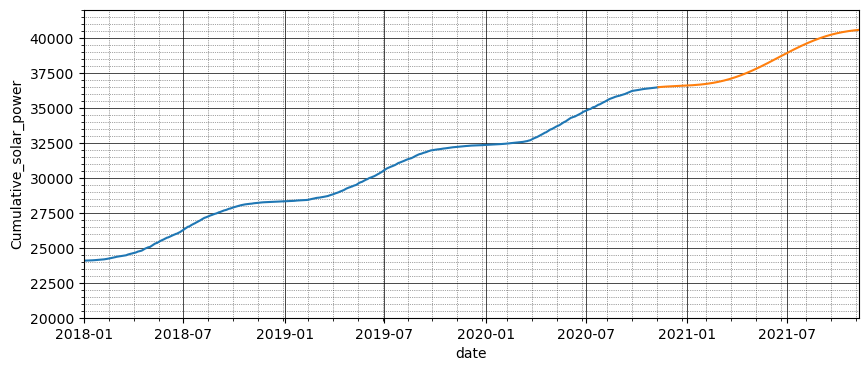

In [68]:
f, ax = plt.subplots(figsize=(10, 4))

sns.lineplot(data=data_ats, x='date', y='Cumulative_solar_power')
sns.lineplot(data=forecast, x=forecast.index, y='Cumulative_solar_power');

ax.set_axisbelow(True)
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.5, color='black',)
ax.grid(which='minor', linestyle=':', linewidth=0.5, color='black', alpha=0.7)

ax.set_ylim(20000, 42000)
ax.set_xlim([datetime(2018,1,1), datetime(2021,11,9)]);

In [73]:
from kats.consts import TimeSeriesData
from kats.models.prophet import ProphetModel, ProphetParams

data_kats = df[['date','Cumulative_solar_power']].copy()
data_kats = data_kats.rename(columns={'date':'time','Cumulative_solar_power':'value'})

train_kats = data_kats[:2600]
test_kats = data_kats[2600:]
data_kats_ts = TimeSeriesData(data_kats)

params = ProphetParams(seasonality_mode='multiplicative')
m = ProphetModel(data_kats_ts, params)
m.fit()
fcst = m.predict(steps=704)
# fcst.head()
m.plot()

ModuleNotFoundError: No module named 'kats'

In [74]:
from kats.models.theta import ThetaModel, ThetaParams

params = ThetaParams(m=365)
m = ThetaModel(data_kats_ts, params)
m.fit()
fcst = m.predict(steps=704, alpha=0.2)
m.plot()

ModuleNotFoundError: No module named 'kats'

In [75]:
from kats.detectors.outlier import OutlierDetector

ts_outlierDetection = OutlierDetector(data_kats_ts, 'additive')
ts_outlierDetection.detector()
ts_outlierDetection.outliers[0]

ModuleNotFoundError: No module named 'kats'

In [76]:
data_kats_ts_outliers_removed = ts_outlierDetection.remover(interpolate = False)
data_kats_ts_outliers_interpolated = ts_outlierDetection.remover(interpolate = True)

fig, ax = plt.subplots(figsize=(16,8), nrows=1, ncols=2)

data_kats_ts_outliers_removed.to_dataframe().plot(x = 'time',y = 'y_0', ax= ax[0])
ax[0].set_title("Outliers Removed : No interpolation")
data_kats_ts_outliers_interpolated.to_dataframe().plot(x = 'time',y = 'y_0', ax= ax[1])
ax[1].set_title("Outliers Removed : With interpolation")
plt.show()

NameError: name 'ts_outlierDetection' is not defined

In [77]:
df.to_csv('solar_panels.csv')